In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load the pre-trained VGG16 model
model = models.vgg16(pretrained=True)
model.eval()

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:10<00:00, 52.8MB/s]


### grad cam

In [ ]:
def get_grad_cam(model, img_tensor, target_layer, target_class):
    model.eval()

    gradients = []

    def save_gradient(grad):
        gradients.append(grad)

    target_layer = dict(model.named_modules())[target_layer]

    target_layer.register_backward_hook(lambda module, grad_input, grad_output: save_gradient(grad_output[0]))
    activations = []

    def forward_hook(module, input, output):
        activations.append(output)

    target_layer.register_forward_hook(forward_hook)

    output = model(img_tensor)
    model.zero_grad()

    target = torch.FloatTensor(1, output.size()[-1]).zero_()
    target[0][target_class] = 1
    output.backward(gradient=target)

    grads_val = gradients[0].cpu().data.numpy()
    activations_val = activations[0].cpu().data.numpy()

    weights = np.mean(grads_val, axis=(2, 3))[0, :]
    cam = np.zeros(activations_val.shape[2:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * activations_val[0, i, :, :]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)
    return cam

def process_image(img_path, model, preprocess, target_layer, target_class):
    img = Image.open(img_path)
    img_tensor = preprocess(img).unsqueeze(0)
    cam = get_grad_cam(model, img_tensor, target_layer, target_class)
    return cam

In [ ]:
import os
img_dir = '/content/drive/MyDrive/datasets/xai/hw2/images'
img_paths = [os.path.join(img_dir, fname) for fname in os.listdir(img_dir) if fname.endswith('.JPEG')]
classes = [''.join(img_paths[i].split('/')[-1][:-5].split('_')[1:]) for i in range(len(img_paths))]


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


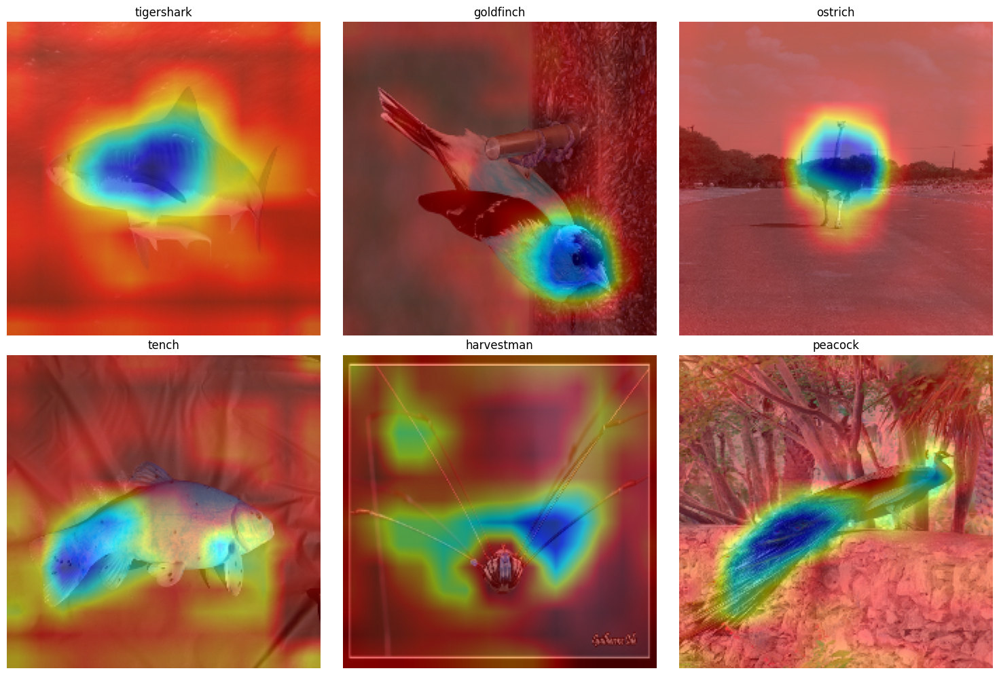

In [ ]:

target_layer = 'features.29'
fig, axes = plt.subplots(2, 3, figsize=(15, 10))


for i, img_path in enumerate(img_paths):
    img = Image.open(img_path)
    img_tensor = preprocess(img).unsqueeze(0)
    output = model(img_tensor)
    _, pred = torch.max(output, 1)
    cam = process_image(img_path, model, preprocess, target_layer, pred)

    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))

    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_img = heatmap + np.float32(img) / 255
    cam_img = cam_img / np.max(cam_img)

    ax = axes[i // 3, i % 3]
    ax.imshow(cam_img)
    ax.axis('off')
    ax.set_title(classes[i])

plt.tight_layout()
plt.show()

### guided backpropagation

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader, Subset
from torchvision.datasets import ImageNet
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

class GuidedBackpropReLU(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input):
        ctx.save_for_backward(input)
        return input.clamp(min=0)

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors
        grad_input = grad_output.clone()
        grad_input[input < 0] = 0
        grad_input[grad_output < 0] = 0
        return grad_input

class GuidedBackpropModel(nn.Module):
    def __init__(self, model):
        super(GuidedBackpropModel, self).__init__()
        self.model = model
        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(self.hook_forward)
                module.register_backward_hook(self.hook_backward)

    def hook_forward(self, module, input, output):
        return GuidedBackpropReLU.apply(output)

    def hook_backward(self, module, grad_input, grad_output):
        return (GuidedBackpropReLU.apply(grad_input[0]),)

    def forward(self, x):
        return self.model(x)

def get_grad_cam(model, img_tensor, target_layer, target_class):
    model.eval()

    gradients = []
    activations = []

    def save_gradient(grad):
        gradients.append(grad)

    target_layer = dict(model.named_modules())[target_layer]

    target_layer.register_backward_hook(lambda module, grad_input, grad_output: save_gradient(grad_output[0]))
    target_layer.register_forward_hook(lambda module, input, output: activations.append(output))

    output = model(img_tensor)
    model.zero_grad()

    target = torch.FloatTensor(1, output.size()[-1]).zero_()
    target[0][target_class] = 1
    output.backward(gradient=target)

    grads_val = gradients[0].cpu().data.numpy()
    activations_val = activations[0].cpu().data.numpy()

    weights = np.mean(grads_val, axis=(2, 3))[0, :]
    cam = np.zeros(activations_val.shape[2:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * activations_val[0, i, :, :]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)
    return cam

def preprocess_image(img_path):
    preprocess = transforms.Compose([
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img = Image.open(img_path)
    img_tensor = preprocess(img).unsqueeze(0)
    return img_tensor

def visualize_gb(gb):
    gb = gb.transpose(1, 2, 0)
    gb = (gb - gb.min()) / (gb.max() - gb.min())
    gb = np.uint8(255 * gb)
    return gb

def visualize_cam_gb(cam, gb):
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_gb = heatmap + np.float32(gb) / 255
    cam_gb = cam_gb / np.max(cam_gb)
    return np.uint8(255 * cam_gb)



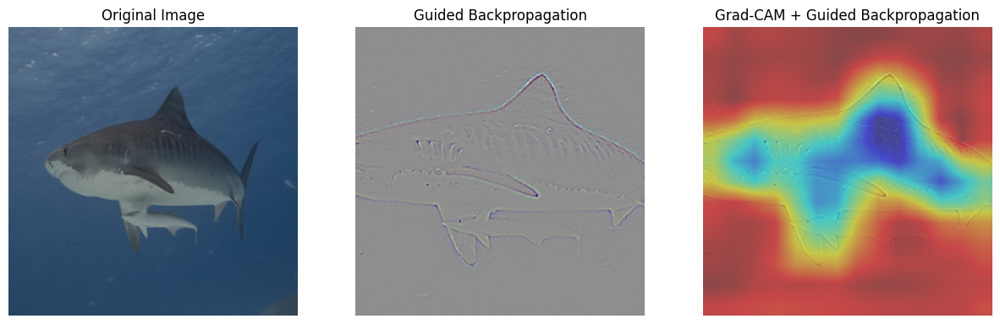

In [ ]:

gb_model = GuidedBackpropModel(model)

img_path = img_paths[0]
img_tensor = preprocess_image(img_path)

target_layer = 'features.29'
output = model(img_tensor)
_, pred = torch.max(output, 1)
target_class = pred.item()
cam = get_grad_cam(model, img_tensor, target_layer, target_class)

img_tensor.requires_grad = True
output = gb_model(img_tensor)
output[0, target_class].backward()

gb = img_tensor.grad[0].cpu().data.numpy()

# Visualize the results
raw_image = np.array(Image.open(img_path).resize((224, 224)))
gb = visualize_gb(gb)
cam_gb = visualize_cam_gb(cam, gb)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(raw_image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Guided Backpropagation')
plt.imshow(gb)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Grad-CAM + Guided Backpropagation')
plt.imshow(cam_gb)
plt.axis('off')

plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


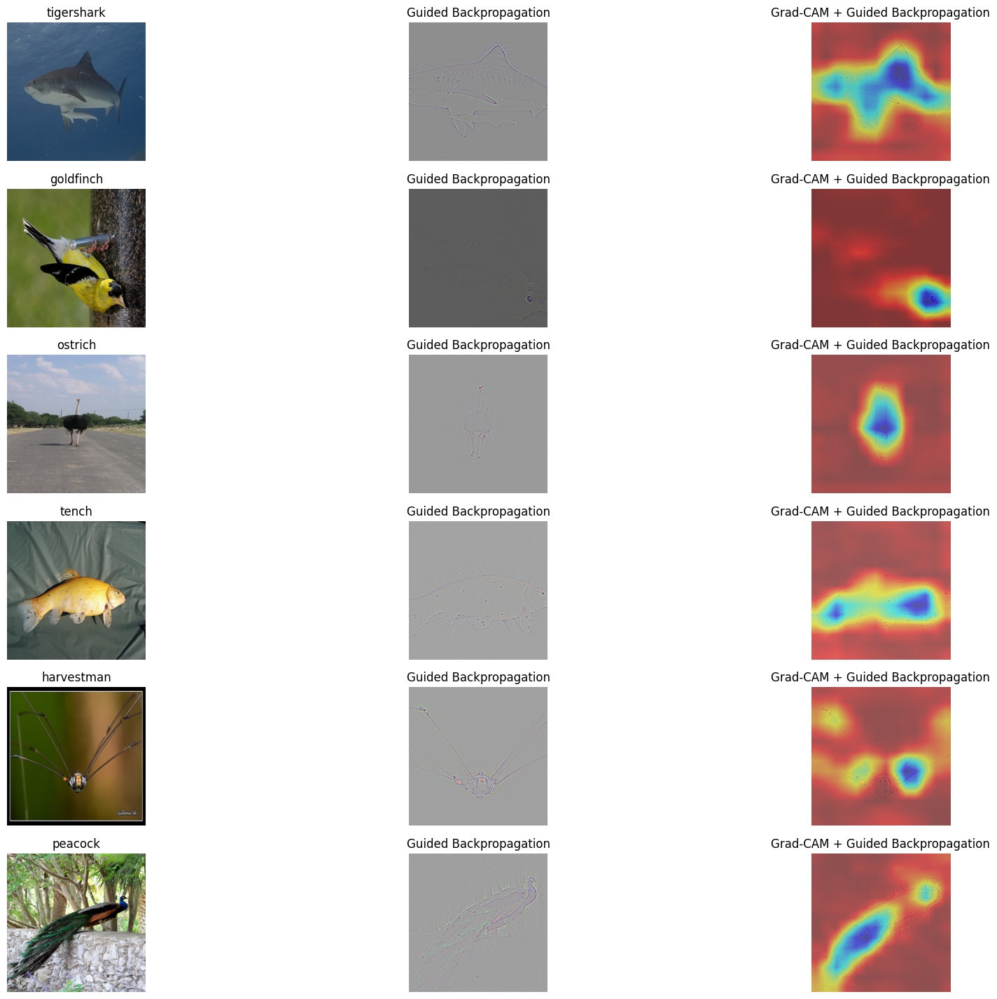

In [ ]:
fig, axes = plt.subplots(6, 3, figsize=(21, 18))

classes = [''.join(img_paths[i].split('/')[-1][:-5].split('_')[1:]) for i in range(len(img_paths))]

model = models.vgg16(pretrained=True)
model.eval()

gb_model = GuidedBackpropModel(model)

for i, img_path in enumerate(img_paths):
  img_tensor = preprocess_image(img_path)

  target_layer = 'features.29'
  output = model(img_tensor)
  _, pred = torch.max(output, 1)
  target_class = pred.item()
  cam = get_grad_cam(model, img_tensor, target_layer, target_class)

  img_tensor.requires_grad = True
  output = gb_model(img_tensor)
  output[0, target_class].backward()

  gb = img_tensor.grad[0].cpu().data.numpy()

  # Visualize the results
  raw_image = np.array(Image.open(img_path).resize((224, 224)))
  gb = visualize_gb(gb)
  cam_gb = visualize_cam_gb(cam, gb)

  ax = axes[i , 0]

  ax.set_title(classes[i])
  ax.axis('off')

  ax.imshow(raw_image)

  axes[i ,  1].imshow(gb)
  axes[i ,  2].imshow(cam_gb)
  axes[i ,  1].set_title('Guided Backpropagation')
  axes[i ,  2].set_title('Grad-CAM + Guided Backpropagation')
  axes[i ,  1].axis('off')
  axes[i ,  2].axis('off')

plt.show()

### guided GRADCAM

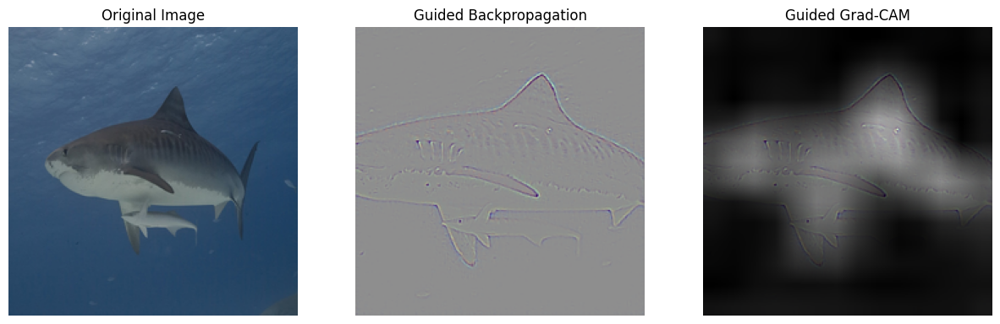

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader, Subset
from torchvision.datasets import ImageNet
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

class GuidedBackpropReLU(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input):
        ctx.save_for_backward(input)
        return input.clamp(min=0)

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors
        grad_input = grad_output.clone()
        grad_input[input < 0] = 0
        grad_input[grad_output < 0] = 0
        return grad_input

class GuidedBackpropModel(nn.Module):
    def __init__(self, model):
        super(GuidedBackpropModel, self).__init__()
        self.model = model
        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(self.hook_forward)
                module.register_backward_hook(self.hook_backward)

    def hook_forward(self, module, input, output):
        return GuidedBackpropReLU.apply(output)

    def hook_backward(self, module, grad_input, grad_output):
        return (GuidedBackpropReLU.apply(grad_input[0]),)

    def forward(self, x):
        return self.model(x)

def get_grad_cam(model, img_tensor, target_layer, target_class):
    model.eval()

    gradients = []
    activations = []

    def save_gradient(grad):
        gradients.append(grad)

    target_layer = dict(model.named_modules())[target_layer]

    target_layer.register_backward_hook(lambda module, grad_input, grad_output: save_gradient(grad_output[0]))
    target_layer.register_forward_hook(lambda module, input, output: activations.append(output))

    output = model(img_tensor)
    model.zero_grad()

    target = torch.FloatTensor(1, output.size()[-1]).zero_()
    target[0][target_class] = 1
    output.backward(gradient=target)

    grads_val = gradients[0].cpu().data.numpy()
    activations_val = activations[0].cpu().data.numpy()

    weights = np.mean(grads_val, axis=(2, 3))[0, :]
    cam = np.zeros(activations_val.shape[2:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * activations_val[0, i, :, :]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)
    return cam

def preprocess_image(img_path):
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img = Image.open(img_path)
    img_tensor = preprocess(img).unsqueeze(0)
    return img_tensor

def visualize_gb(gb):
    gb = gb.transpose(1, 2, 0)
    gb = (gb - gb.min()) / (gb.max() - gb.min())
    gb = np.uint8(255 * gb)
    return gb

def visualize_guided_gradcam(cam, gb):
    cam = np.expand_dims(cam, axis=2)
    guided_gradcam = cam * gb
    guided_gradcam = (guided_gradcam - guided_gradcam.min()) / (guided_gradcam.max() - guided_gradcam.min())
    guided_gradcam = np.uint8(255 * guided_gradcam)
    return guided_gradcam

model = models.vgg16(pretrained=True)
model.eval()

gb_model = GuidedBackpropModel(model)

img_tensor = preprocess_image(img_paths[0])

target_layer = 'features.29'
output = model(img_tensor)
_, pred = torch.max(output, 1)
target_class = pred.item()
cam = get_grad_cam(model, img_tensor, target_layer, target_class)

img_tensor.requires_grad = True
output = gb_model(img_tensor)
output[0, target_class].backward()

gb = img_tensor.grad[0].cpu().data.numpy()

raw_image = np.array(Image.open(img_paths[0]).resize((224, 224)))
gb = visualize_gb(gb)
guided_gradcam = visualize_guided_gradcam(cam, gb)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(raw_image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Guided Backpropagation')
plt.imshow(gb)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Guided Grad-CAM')
plt.imshow(guided_gradcam)
plt.axis('off')

plt.show()


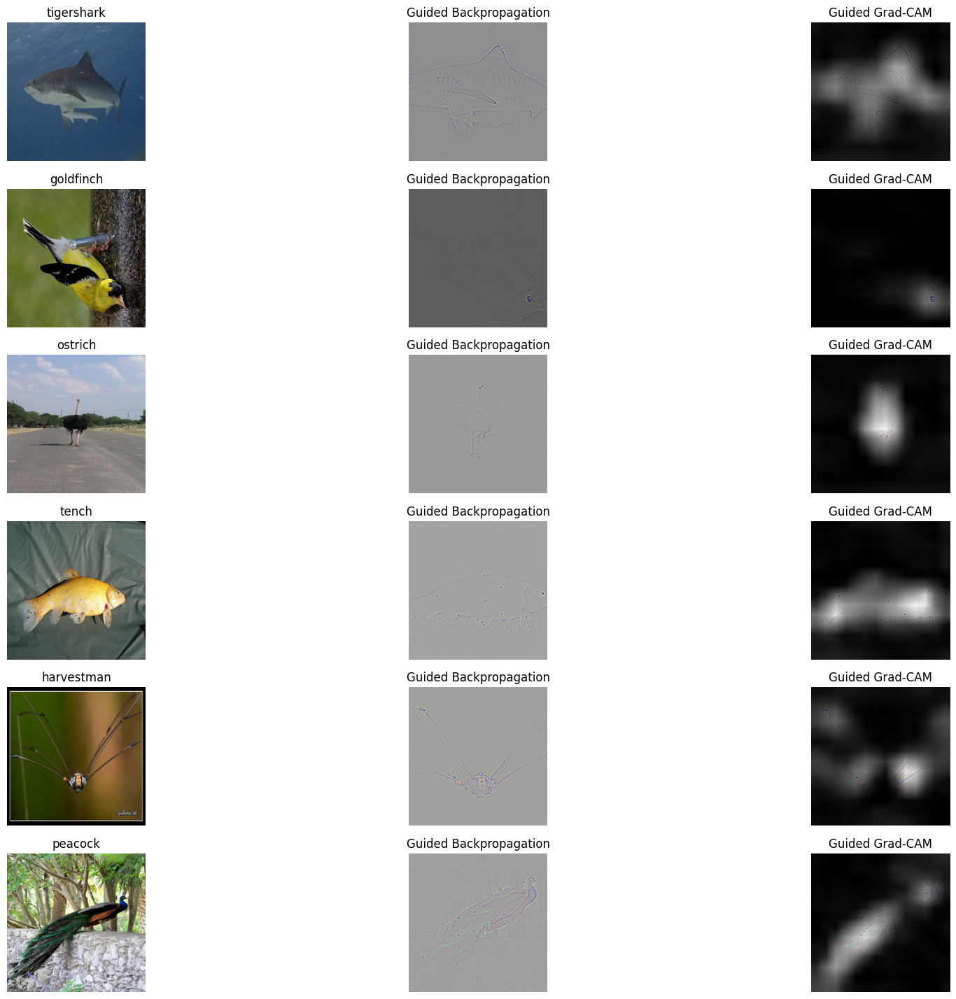

In [ ]:
fig, axes = plt.subplots(6, 3, figsize=(21, 18))

classes = [''.join(img_paths[i].split('/')[-1][:-5].split('_')[1:]) for i in range(len(img_paths))]

# Load the VGG16 model
model = models.vgg16(pretrained=True)
model.eval()

gb_model = GuidedBackpropModel(model)

for i, img_path in enumerate(img_paths):
  img_tensor = preprocess_image(img_path)

  target_layer = 'features.29'
  output = model(img_tensor)
  _, pred = torch.max(output, 1)
  target_class = pred.item()
  cam = get_grad_cam(model, img_tensor, target_layer, target_class)

  img_tensor.requires_grad = True
  output = gb_model(img_tensor)
  output[0, target_class].backward()

  gb = img_tensor.grad[0].cpu().data.numpy()

  raw_image = np.array(Image.open(img_path).resize((224, 224)))
  gb = visualize_gb(gb)
  cam_gb = visualize_guided_gradcam(cam, gb)

  ax = axes[i , 0]

  ax.set_title(classes[i])
  ax.axis('off')

  ax.imshow(raw_image)

  axes[i ,  1].imshow(gb)
  axes[i ,  2].imshow(cam_gb)
  axes[i ,  1].set_title('Guided Backpropagation')
  axes[i ,  2].set_title('Guided Grad-CAM')
  axes[i ,  1].axis('off')
  axes[i ,  2].axis('off')

plt.show()

### smoothgrad

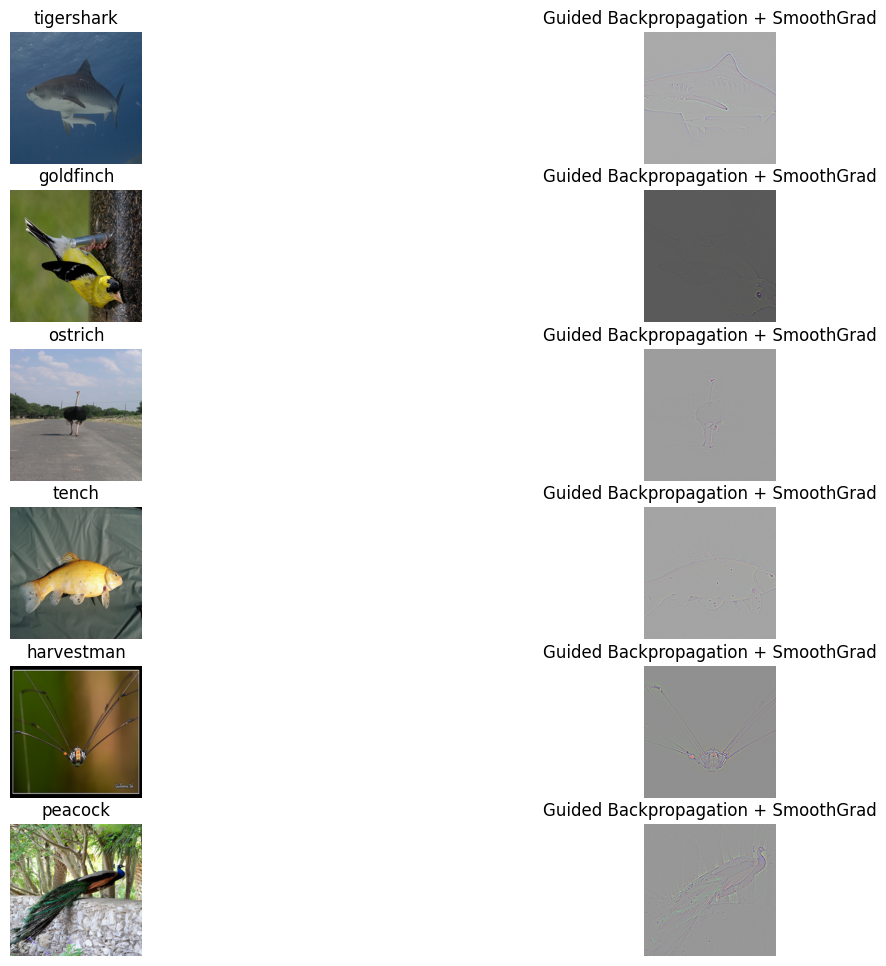

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

class GuidedBackpropReLU(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input):
        ctx.save_for_backward(input)
        return input.clamp(min=0)

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors
        grad_input = grad_output.clone()
        grad_input[input < 0] = 0
        grad_input[grad_output < 0] = 0
        return grad_input

class GuidedBackpropModel(nn.Module):
    def __init__(self, model):
        super(GuidedBackpropModel, self).__init__()
        self.model = model
        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(self.hook_forward)
                module.register_backward_hook(self.hook_backward)

    def hook_forward(self, module, input, output):
        return GuidedBackpropReLU.apply(output)

    def hook_backward(self, module, grad_input, grad_output):
        return (GuidedBackpropReLU.apply(grad_input[0]),)

    def forward(self, x):
        return self.model(x)

def get_grad_cam(model, img_tensor, target_layer, target_class):
    model.eval()

    gradients = []
    activations = []

    def save_gradient(grad):
        gradients.append(grad)

    target_layer = dict(model.named_modules())[target_layer]

    target_layer.register_backward_hook(lambda module, grad_input, grad_output: save_gradient(grad_output[0]))
    target_layer.register_forward_hook(lambda module, input, output: activations.append(output))

    output = model(img_tensor)
    model.zero_grad()

    target = torch.FloatTensor(1, output.size()[-1]).zero_()
    target[0][target_class] = 1
    output.backward(gradient=target)

    grads_val = gradients[0].cpu().data.numpy()
    activations_val = activations[0].cpu().data.numpy()

    weights = np.mean(grads_val, axis=(2, 3))[0, :]
    cam = np.zeros(activations_val.shape[2:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * activations_val[0, i, :, :]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)
    return cam

def preprocess_image(img_path):
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img = Image.open(img_path)
    img_tensor = preprocess(img).unsqueeze(0)
    return img_tensor

def visualize_gb(gb):
    if gb.shape[0] == 3:  # (3, H, W) -> (H, W, 3)
        gb = gb.transpose(1, 2, 0)
    elif gb.shape[0] == 1:  # (1, H, W) -> (H, W)
        gb = gb.squeeze(0)
    gb = (gb - gb.min()) / (gb.max() - gb.min())
    gb = np.uint8(255 * gb)
    return gb

def smooth_grad(gb_model, img_tensor, target_class, num_samples=50, noise_level=0.1):
    gb_sum = np.zeros_like(img_tensor.cpu().data.numpy())
    img_tensor = img_tensor.clone().detach()

    for i in range(num_samples):
        noise = torch.randn(img_tensor.size()).to(img_tensor.device) * noise_level
        noisy_img = img_tensor + noise
        noisy_img.requires_grad = True

        output = gb_model(noisy_img)
        gb_model.zero_grad()
        output[0, target_class].backward()

        gb = noisy_img.grad[0].cpu().data.numpy()
        gb_sum += gb

    smooth_gb = gb_sum / num_samples
    return smooth_gb


fig, axes = plt.subplots(6, 2, figsize=(15, 12))

classes = [''.join(img_paths[i].split('/')[-1][:-5].split('_')[1:]) for i in range(len(img_paths))]

for i, img_path in enumerate(img_paths):

  img_tensor = preprocess_image(img_path)

  output = model(img_tensor)
  _, pred = torch.max(output, 1)
  target_class = pred.item()

  smooth_gb = smooth_grad(gb_model, img_tensor, target_class)

  raw_image = np.array(Image.open(img_path).resize((224, 224)))
  smooth_gb = visualize_gb(smooth_gb[0])

  ax = axes[i , 0]

  ax.set_title(classes[i])
  ax.axis('off')

  ax.imshow(raw_image)

  axes[i ,  1].imshow(smooth_gb)
  axes[i ,  1].set_title('Guided Backpropagation + SmoothGrad')
  axes[i ,  1].axis('off')

plt.show()

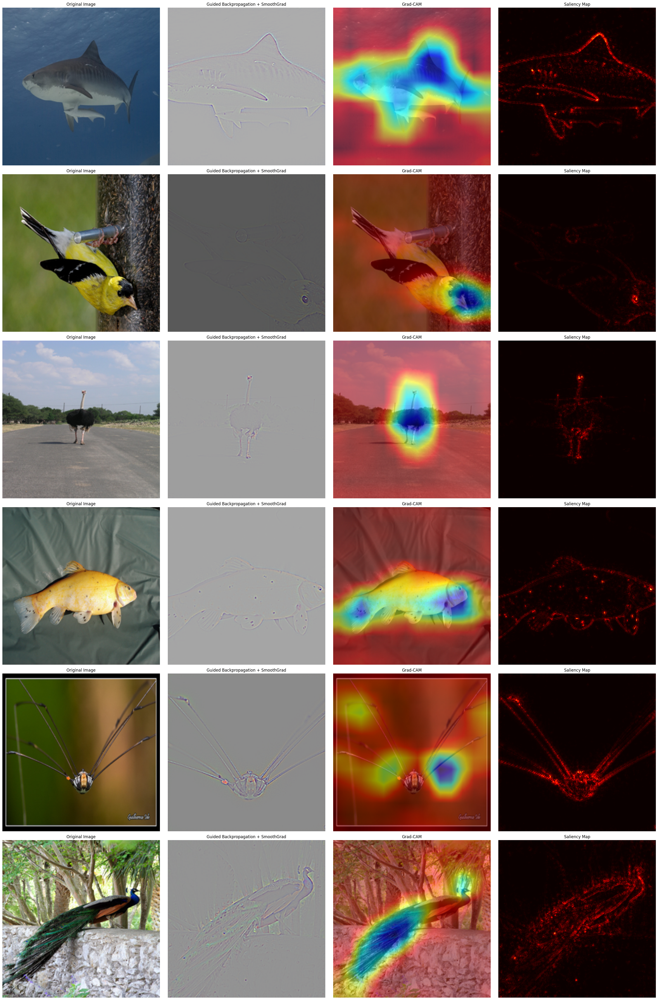

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

class GuidedBackpropReLU(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input):
        ctx.save_for_backward(input)
        return input.clamp(min=0)

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors
        grad_input = grad_output.clone()
        grad_input[input < 0] = 0
        grad_input[grad_output < 0] = 0
        return grad_input

class GuidedBackpropModel(nn.Module):
    def __init__(self, model):
        super(GuidedBackpropModel, self).__init__()
        self.model = model
        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(self.hook_forward)
                module.register_backward_hook(self.hook_backward)

    def hook_forward(self, module, input, output):
        return GuidedBackpropReLU.apply(output)

    def hook_backward(self, module, grad_input, grad_output):
        return (GuidedBackpropReLU.apply(grad_input[0]),)

    def forward(self, x):
        return self.model(x)

def get_grad_cam(model, img_tensor, target_layer, target_class):
    model.eval()

    gradients = []
    activations = []

    def save_gradient(grad):
        gradients.append(grad)

    target_layer = dict(model.named_modules())[target_layer]

    target_layer.register_backward_hook(lambda module, grad_input, grad_output: save_gradient(grad_output[0]))
    target_layer.register_forward_hook(lambda module, input, output: activations.append(output))

    output = model(img_tensor)
    model.zero_grad()

    target = torch.FloatTensor(1, output.size()[-1]).zero_()
    target[0][target_class] = 1
    output.backward(gradient=target)

    grads_val = gradients[0].cpu().data.numpy()
    activations_val = activations[0].cpu().data.numpy()

    weights = np.mean(grads_val, axis=(2, 3))[0, :]
    cam = np.zeros(activations_val.shape[2:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * activations_val[0, i, :, :]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)
    return cam

def preprocess_image(img_path):
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img = Image.open(img_path)
    img_tensor = preprocess(img).unsqueeze(0)
    return img_tensor

def visualize_gb(gb):
    if gb.shape[0] == 3:
        gb = gb.transpose(1, 2, 0)
    elif gb.shape[0] == 1:
        gb = gb.squeeze(0)
    gb = (gb - gb.min()) / (gb.max() - gb.min())
    gb = np.uint8(255 * gb)
    return gb

def smooth_grad(gb_model, img_tensor, target_class, num_samples=50, noise_level=0.1):
    gb_sum = np.zeros_like(img_tensor.cpu().data.numpy())
    img_tensor = img_tensor.clone().detach()

    for i in range(num_samples):
        noise = torch.randn(img_tensor.size()).to(img_tensor.device) * noise_level
        noisy_img = img_tensor + noise
        noisy_img.requires_grad = True

        output = gb_model(noisy_img)
        gb_model.zero_grad()
        output[0, target_class].backward()

        gb = noisy_img.grad[0].cpu().data.numpy()
        gb_sum += gb

    smooth_gb = gb_sum / num_samples
    return smooth_gb

def saliency_map(model, img_tensor, target_class):
    img_tensor.requires_grad_()
    output = model(img_tensor)
    model.zero_grad()
    output[0, target_class].backward()
    saliency = img_tensor.grad.abs().squeeze().cpu().data.numpy()
    return saliency

def visualize_saliency(saliency):
    if len(saliency.shape) == 3:
        saliency = np.max(saliency, axis=0)
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    saliency = np.uint8(255 * saliency)
    return saliency

target_layer = 'features.29'

fig, axes = plt.subplots(len(img_paths), 4, figsize=(28, len(img_paths) * 7))

for i, img_path in enumerate(img_paths):
    img_tensor = preprocess_image(img_path)
    raw_image = np.array(Image.open(img_path).resize((224, 224)))

    output = model(img_tensor)
    _, pred = torch.max(output, 1)
    target_class = pred.item()

    smooth_gb = smooth_grad(gb_model, img_tensor, target_class)
    cam = get_grad_cam(model, img_tensor, target_layer, target_class)
    saliency = saliency_map(model, img_tensor, target_class)

    smooth_gb = visualize_gb(smooth_gb[0])
    cam = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    cam = np.float32(cam) / 255
    cam = cam + np.float32(raw_image) / 255
    cam = cam / np.max(cam)
    cam = np.uint8(255 * cam)

    saliency = visualize_saliency(saliency)

    axes[i, 0].set_title('Original Image')
    axes[i, 0].imshow(raw_image)
    axes[i, 0].axis('off')

    axes[i, 1].set_title('Guided Backpropagation + SmoothGrad')
    axes[i, 1].imshow(smooth_gb)
    axes[i, 1].axis('off')

    axes[i, 2].set_title('Grad-CAM')
    axes[i, 2].imshow(cam)
    axes[i, 2].axis('off')

    axes[i, 3].set_title('Saliency Map')
    axes[i, 3].imshow(saliency, cmap='hot')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()



### adversary images

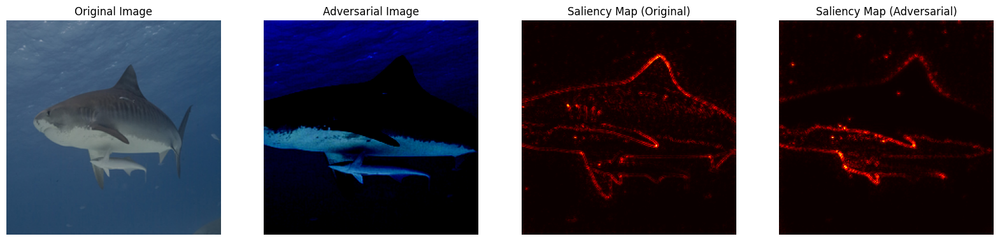

6


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def pgd_attack(model, images, labels, eps=0.01, alpha=0.001, iters=20):
    images = images.clone().detach().to(images.device)
    labels = labels.clone().detach().to(images.device)
    loss = nn.CrossEntropyLoss()

    ori_images = images.data

    for i in range(iters):
        images.requires_grad = True
        outputs = model(images)

        model.zero_grad()
        cost = loss(outputs, labels).to(images.device)
        cost.backward()

        adv_images = images + alpha*images.grad.sign()
        eta = torch.clamp(adv_images - ori_images, min=-eps, max=eps)
        images = torch.clamp(ori_images + eta, min=0, max=1).detach_()

    return images

class GuidedBackpropReLU(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input):
        ctx.save_for_backward(input)
        return input.clamp(min=0)

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors
        grad_input = grad_output.clone()
        grad_input[input < 0] = 0
        grad_input[grad_output < 0] = 0
        return grad_input

class GuidedBackpropModel(nn.Module):
    def __init__(self, model):
        super(GuidedBackpropModel, self).__init__()
        self.model = model
        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(self.hook_forward)
                module.register_backward_hook(self.hook_backward)

    def hook_forward(self, module, input, output):
        return GuidedBackpropReLU.apply(output)

    def hook_backward(self, module, grad_input, grad_output):
        return (GuidedBackpropReLU.apply(grad_input[0]),)

    def forward(self, x):
        return self.model(x)

def preprocess_image(img_path):
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img = Image.open(img_path)
    img_tensor = preprocess(img).unsqueeze(0)
    return img_tensor

def visualize_gb(gb):
    if gb.shape[0] == 3:
        gb = gb.transpose(1, 2, 0)
    elif gb.shape[0] == 1:
        gb = gb.squeeze(0)
    gb = (gb - gb.min()) / (gb.max() - gb.min())
    gb = np.uint8(255 * gb)
    return gb

def saliency_map(model, img_tensor, target_class):
    img_tensor.requires_grad = True
    output = model(img_tensor)
    model.zero_grad()
    output[0, target_class].backward()
    saliency = img_tensor.grad.data.abs().squeeze().cpu().numpy()
    saliency = np.max(saliency, axis=0)
    return saliency

model = models.vgg16(pretrained=True)
model.eval()

gb_model = GuidedBackpropModel(model)

img_path = img_paths[0]
img_tensor = preprocess_image(img_path)

output = model(img_tensor)
_, pred = torch.max(output, 1)
target_class = pred.item()

adv_img_tensor = pgd_attack(model, img_tensor, torch.tensor([target_class]), eps=0.005, alpha=0.001, iters=10)

saliency = saliency_map(model, img_tensor, target_class)

adv_saliency = saliency_map(model, adv_img_tensor, target_class)

raw_image = np.array(Image.open(img_path).resize((224, 224)))
adv_image = adv_img_tensor.squeeze().permute(1, 2, 0).detach().numpy()
adv_image = (adv_image - adv_image.min()) / (adv_image.max() - adv_image.min())

plt.figure(figsize=(20, 5))
plt.subplot(1, 4, 1)
plt.title('Original Image')
plt.imshow(raw_image)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title('Adversarial Image')
plt.imshow(adv_image)
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title('Saliency Map (Original)')
plt.imshow(saliency, cmap='hot')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title('Saliency Map (Adversarial)')
plt.imshow(adv_saliency, cmap='hot')
plt.axis('off')

plt.show()

output = model(adv_img_tensor)
_, pred = torch.max(output, 1)
target_class_adv = pred.item()
print(target_class_adv)

### feature visualization

Iteration 25/500, Loss: -4.947511672973633
Iteration 50/500, Loss: -9.647313117980957
Iteration 75/500, Loss: -19.31849479675293
Iteration 100/500, Loss: -33.29571533203125
Iteration 125/500, Loss: -48.269020080566406
Iteration 150/500, Loss: -66.53584289550781
Iteration 175/500, Loss: -87.37692260742188
Iteration 200/500, Loss: -108.56719970703125
Iteration 225/500, Loss: -129.0146942138672
Iteration 250/500, Loss: -147.97215270996094
Iteration 275/500, Loss: -165.32479858398438
Iteration 300/500, Loss: -181.2959747314453
Iteration 325/500, Loss: -197.34861755371094
Iteration 350/500, Loss: -214.50755310058594
Iteration 375/500, Loss: -231.73619079589844
Iteration 400/500, Loss: -247.79640197753906
Iteration 425/500, Loss: -262.6810607910156
Iteration 450/500, Loss: -276.7103576660156
Iteration 475/500, Loss: -289.75152587890625
Iteration 500/500, Loss: -302.0224304199219


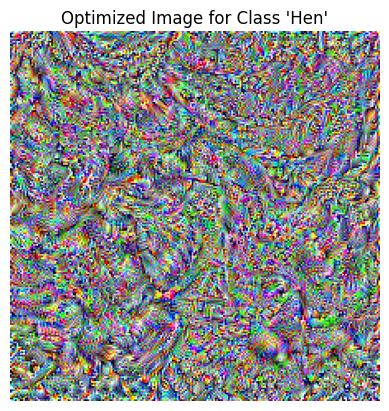

In [ ]:
import torch
from torchvision import models, transforms
import numpy as np
import matplotlib.pyplot as plt

target_class = 8

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.vgg16(pretrained=True).to(device)
model.eval()

def get_loss(output, target_class):
    return -output[0, target_class]

def activation_maximization(img, model, target_class, iterations):
    optimizer = torch.optim.AdamW([img])
    for i in range(iterations):
        optimizer.zero_grad()
        output = model(img)
        loss = get_loss(output, target_class)
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            img.clamp_(0, 1)

        if (i + 1) % 25 == 0:
            print(f"Iteration {i+1}/{iterations}, Loss: {loss.item()}")

    return img.detach()

input_image = np.random.uniform(0, 1, (224, 224, 3)).astype(np.float32)
input_tensor = transforms.ToTensor()(input_image).unsqueeze(0).to(device).requires_grad_(True)

optimized_img = activation_maximization(input_tensor, model, target_class, iterations=500)

optimized_image = optimized_img.squeeze().permute(1, 2, 0).cpu().numpy()
optimized_image = np.clip(optimized_image, 0, 1)

plt.imshow(optimized_image)
plt.title("Optimized Image for Class 'Hen'")
plt.axis('off')
plt.show()


In [ ]:
import torch
from torchvision import models, transforms
import numpy as np
import matplotlib.pyplot as plt

target_class = 8


model = models.vgg16(pretrained=True)
model.eval()

def get_loss(output, target_class):
    return -output[0, target_class]

def total_variation_loss(image):
    diff1 = image[:, :, 1:, :] - image[:, :, :-1, :]
    diff2 = image[:, :, :, 1:] - image[:, :, :, :-1]
    return torch.sum(torch.abs(diff1)) + torch.sum(torch.abs(diff2))

def random_shift(img, max_shift=5):
    _, _, h, w = img.size()
    shift_x = np.random.randint(-max_shift, max_shift)
    shift_y = np.random.randint(-max_shift, max_shift)

    img = torch.roll(img, shifts=(shift_x, shift_y), dims=(2, 3))
    return img, (shift_x, shift_y)

def reverse_shift(img, shifts):
    shift_x, shift_y = shifts
    img = torch.roll(img, shifts=(-shift_x, -shift_y), dims=(2, 3))
    return img

def activation_maximization(img, model, target_class, iterations, tv_weight=1e-4, max_shift=5):
    optimizer = torch.optim.AdamW([img], lr=0.1)
    for i in range(iterations):
        optimizer.zero_grad()

        shifted_img, shifts = random_shift(img, max_shift)

        output = model(shifted_img)
        class_loss = get_loss(output, target_class)
        tv_loss = total_variation_loss(shifted_img) * tv_weight
        loss = class_loss + tv_loss
        loss.backward()

        shifted_img = reverse_shift(shifted_img, shifts)

        optimizer.step()

        with torch.no_grad():
            img.clamp_(0, 1)

        if (i + 1) % 25 == 0:
            print(f"Iteration {i+1}/{iterations}, Class Loss: {class_loss.item()}, TV Loss: {tv_loss.item()}, Total Loss: {loss.item()}")

    return img.detach()




Iteration 25/500, Class Loss: -24.94823455810547, TV Loss: 511.6564636230469, Total Loss: 486.7082214355469
Iteration 50/500, Class Loss: -102.93098449707031, TV Loss: 503.1923828125, Total Loss: 400.26141357421875
Iteration 75/500, Class Loss: -140.8756561279297, TV Loss: 555.4086303710938, Total Loss: 414.532958984375
Iteration 100/500, Class Loss: -173.6211395263672, TV Loss: 575.59228515625, Total Loss: 401.97113037109375
Iteration 125/500, Class Loss: -195.66062927246094, TV Loss: 604.0160522460938, Total Loss: 408.35540771484375
Iteration 150/500, Class Loss: -191.21348571777344, TV Loss: 599.6980590820312, Total Loss: 408.48455810546875
Iteration 175/500, Class Loss: -218.1896514892578, TV Loss: 607.2473754882812, Total Loss: 389.0577392578125
Iteration 200/500, Class Loss: -236.32215881347656, TV Loss: 608.80419921875, Total Loss: 372.4820556640625
Iteration 225/500, Class Loss: -239.3666229248047, TV Loss: 603.5641479492188, Total Loss: 364.197509765625
Iteration 250/500, Clas

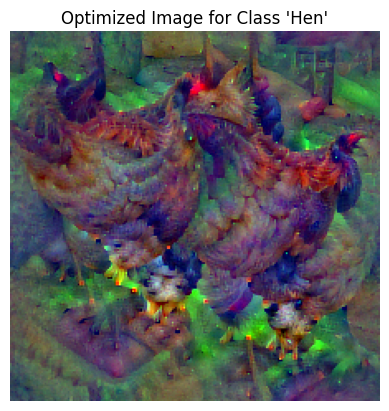

In [ ]:
input_image = np.random.uniform(0, 1, (224, 224, 3)).astype(np.float32)
input_tensor = transforms.ToTensor()(input_image).unsqueeze(0).to(device).requires_grad_(True)

optimized_img = activation_maximization(input_tensor, model, target_class, iterations=500, tv_weight=0.05, max_shift=10)

optimized_image = optimized_img.squeeze().permute(1, 2, 0).cpu().numpy()
optimized_image = np.clip(optimized_image, 0, 1)

plt.imshow(optimized_image)
plt.title("Optimized Image for Class 'Hen'")
plt.axis('off')
plt.show()